<a href="https://colab.research.google.com/github/NiklasUllmann/NAK_MaschinellesLernen/blob/main/ML_NAK_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Wie hoch ist das Risiko eines Waldbrandes in Kalifonien?** 🔥


* Modul: Maschinelles Lernen
* Dozent: Uwe Neuhaus
* Gruppe: Sneezy


In [ ]:
!pip install category_encoders
!pip install tensorflow
!pip install geopandas
!pip install pygeos
!pip install shapely
!pip install fiona
!pip install packaging
!pip install pyproj
!pip install geoplot



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# bitte löschen :D

# Hyperparameter Tuning / PCA / Best feature Subset
# Mit besten Parametern und betsem Klassifier finales Training auf KFold
# Optional: LSTM ?!

# PIA: WindRun löschen? Weil gleich mit Wind_Speed

#Variablen besser erklären
#Ausreißer: Sol_Rad und Wind_Avg_Speed -> Scatterplots nebeneinander? 
#Ausreißer: Z-Wert einpendeln (wahrscheinlich 4, Konfidenzintervall berücksichtigen)
#Ausreißer: Datenqualität nach Bereinigung kurz beschreiben
#Bivariate Analyse: Neues Unterkapitel Target auf andere Variablen untersuchen
#Univariat: Beschreibung der Boxplots und den Histogrammen / Beschreibung der Skalen Lou
#Bivariat: Pairplot beschreiben Lena
#Bivariat: Korrelationen zu Ende beschreiben (Tabelle neben der Heatmap möglich?)
# Giederung anpassen ( später)
# Einleitung
# Code kommentieren und kopieren
# Variablen Benennung

# Tuning Visualisierung schön machen

# echtes Beispiel

# FAZIT! (Zusammenfassung, Ergebnisse, Ausblick!)

# packages aufräumen!
# Jeder Quellen suchen, texte schreiben

# VORLAGE:

testststststststststs

* Autor, Titel, Datum/Jahr, Link




In [ ]:
# Import Packages
import requests
import pandas as pd
import numpy as np
import category_encoders as ce

# Surpress all warnings
def warn(*args, **kwargs):
    pass
import warnings

import copy
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.exceptions import ConvergenceWarning
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import geoplot as gplt
import matplotlib.patches as mpatches
from collections import Counter
from sklearn.model_selection import StratifiedKFold
from shapely.geometry import Point


from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.stats import skew #Schiefe bei Target
from prettytable import PrettyTable #Tabelle bei der Beschreibung der Variablen


In [ ]:
# Setze Random State für alle Ausführungen gleich
random_state = 42

In [ ]:
# Vergabe eines einheitlichen Stils für Seaborn Grafiken
sns.set(style="darkgrid")
colors = sns.color_palette("RdBu", 10)
sns.set_palette(colors)

In [ ]:
# Install Packages

# 1. Problembeschreibung



Zunehmend  deutlich  wird  die  Erderwärmung  von  der  Politik,  der  internationalen Staatengemeinschaft, der Gesellschaft und auch dem Rechtswesen adressiert (Berz, 2021). Durch die Veröffentlichung des 1,5°C Berichts des Intergovernmental Panel on Climate  Change  (IPPC)  wurde  eine  wissenschaftlich  fundierte  Faktenlage  mit  in  die Diskussion der Klimakrise eingebracht. Stärkere Dürren sind nur eine von vielen Folgen der  zunehmenden  Erderwärmung.  Gerade  Regionen  in  Nordamerika,  Mittel-und Südeuropa  sowie  in  Russland  kämpfen auf  Grund  dessen mit  der  immer  größer werdendenGefahr  von  Waldbränden. Um  die  Menschenbestimmter  Regionen rechtzeitig vor potenziellen Bränden zu warnen, sind Frühwarnsysteme unumgänglich. Hier setzt diese Arbeit an: Das Ziel ist es,auf Basis eines herangezogenen Datensatzeseine Anwendung zu programmieren, welche die Gefahr von Waldbränden mit Hilfe von Umgebungsvariabelnklassifizieren kann.

# 2. Der Datensatz
##2.1 Laden und Mergen der Daten

In [ ]:
# Stream Data from online source
url = "https://github.com/NiklasUllmann/NAK_MaschinellesLernen/raw/main/dataset_forestfires"
response = requests.get(url, stream=True)

# Convert raw download to 2d array
data_index = response.text.index('@DATA\n')
raw_data = response.text[data_index + 6:-1]
data = [list(map(lambda x: x if x != '?'else np.nan, i.replace("'","").split(","))) for i in raw_data.split("\n")]


In [ ]:
# Define Column names and data types
column_names =[ "Stn_Id","Stn_Name","CIMIS_Region","Date","ETo","Precip","Sol_Rad","Avg_Vap_Pres","Max_Air_Temp","Min_Air_Temp","Avg_Air_Temp","Max_Rel_Hum","Min_Rel_Hum","Avg_Rel_Hum","Dew_Point","Avg_Wind_Speed","Wind_Run","Avg_Soil_Temp","Target"]
column_dtypes = {"Target": int, "Stn_Id": int, "Stn_Name": str,"CIMIS_Region": str, "Date": np.datetime64, "ETo":float, "Precip":float, "Sol_Rad":float, "Avg_Vap_Pres":float, "Max_Air_Temp":float, "Min_Air_Temp":float, "Avg_Air_Temp":float, "Max_Rel_Hum":float, "Min_Rel_Hum":float, "Avg_Rel_Hum":float, "Dew_Point":float,"Avg_Wind_Speed":float,"Wind_Run":float,"Avg_Soil_Temp":float    }



In [ ]:
# Create final Dataframe 
df = pd.DataFrame(data, columns = column_names)
# Convert columns to datatypes
df = df.astype(column_dtypes)



In [ ]:
#Laden der Lokationsdaten
url = "https://raw.githubusercontent.com/NiklasUllmann/NAK_MaschinellesLernen/main/locations.json"
response = requests.get(url, stream=True)

stations = response.json()

coords = []

for i in stations["Stations"]:
  coords.append(
     {
          "station": i["Name"],
          "Lat": float(i["HmsLatitude"].split("/")[1]),
          "Long": float(i["HmsLongitude"].split("/")[1])
      }
      
  )
df_coords = pd.DataFrame.from_dict(coords)


In [ ]:
# Merge Dataframes
df = pd.merge(left=df , right=df_coords, left_on="Stn_Name", right_on="station")

# Drop old station column
df = df.drop(labels=['station'], axis=1)

##2.2 Erste Untersuchung des Datensatzes

In [ ]:
# Erste Zeilen des neuen Datensatzes anzeigen
df.head()

,Stn_Id,Stn_Name,CIMIS_Region,Date,ETo,Precip,Sol_Rad,Avg_Vap_Pres,Max_Air_Temp,Min_Air_Temp,...,Max_Rel_Hum,Min_Rel_Hum,Avg_Rel_Hum,Dew_Point,Avg_Wind_Speed,Wind_Run,Avg_Soil_Temp,Target,Lat,Long
0,2,FivePoints,San Joaquin Valley,2018-01-01,0.060,0.000,219.000,7.300,63.400,35.300,...,82.000,46.000,65.000,36.600,3.300,78.300,51.100,0,36.336,-120.113
1,2,FivePoints,San Joaquin Valley,2018-01-02,0.040,0.000,127.000,7.400,59.800,37.700,...,80.000,52.000,67.000,36.700,3.100,74.500,51.300,0,36.336,-120.113
2,2,FivePoints,San Joaquin Valley,2018-01-03,0.040,0.000,125.000,8.400,61.100,37.300,...,79.000,49.000,68.000,39.900,4.500,107.500,51.300,0,36.336,-120.113
3,2,FivePoints,San Joaquin Valley,2018-01-04,0.070,0.010,219.000,11.600,69.200,48.700,...,94.000,52.000,74.000,48.500,5.800,140.200,53.000,0,36.336,-120.113
4,2,FivePoints,San Joaquin Valley,2018-01-05,0.070,0.000,239.000,12.700,73.800,47.500,...,94.000,49.000,72.000,50.800,4.200,101.400,54.400,0,36.336,-120.113


In [ ]:
#Anzeige der Spalten und Anzahl der Features
print('Anzahl Beobachtungen und Anzahl Features:')
df.shape

Anzahl Beobachtungen und Anzahl Features:


(129058, 21)

In [ ]:
#Ermittlung Anzahl des Messtationen
unique_values = df['Stn_Id'].nunique()
print('Anzahl der Messstationen:')
print(unique_values)

Anzahl der Messstationen:
153


## 2.3 Beschreibung des Datensatzes

Der Datensatz ist öffentlich verfügbar und unter https://www.openml.org/search?type=data&status=active&id=43606 abrufbar. Der Herausgeber ist das California Irrigation Management Information System (CIMIS), welches dem California Department of Water Resorces unterstellt ist. Der Datensatz beinhaltet verschiedene geografische und meterologische Messdaten aus ganz Kalifornien aus den Jahren 2018 bis 2022, welche im Folgenden näher erläutert werden sollen. Insgesamt liegen in diesem  Datensatz 129058 Beobachtungen und 19 Variablen vor, welche an 153 verschidenen Messstationen in Kalifornien erhoben wurden.

Dieser wird mit einem Datensatz verbunden, der die Namen der Messtationen ("station") sowie deren Koordinaten in Längen- und Breitengraden der Messstationen enthält (HmsLatitude und HmsLongitude). Dies soll spätere Auswertungen und Visualisierungen auf Basis der genaueren Lokation der Messstationen zu ermöglichen. 
Der Datensatz mit den Lokationsdaten ist öffentlich verfügbar unter https://et.water.ca.gov/api/station.

Die Variable "station" wird im Zuge des Merges in Verbindung mit "Stn_Name" genutzt, um die Daten zu verbinden.
#Hier noch mal die Formulierung prüfen!

Nach der erfolgreichen Verknüpfung, wird die Variable "station" aus dem Datensatz entfernt, um offensichtliche Redundanzen zu vermeiden.

Die Anzahl der Variablen steigt durch den Merge entsprechend um 2 auf insgesamt 21 Variablen.


Um die Verfügbarkeit der Datensätze sicherzustellen, wurden diese auf einer Github-Seite hinterlegt. Von dieser werden die Daten in diesem Notebook geladen, wobei die Datensätze vorab nicht verändert worden und deckungsgleich zu den Daten auf den offiziellen Seiten sind. 


In [ ]:
#Darstellung der Variablen in einer Tabelle
tabelle = PrettyTable(['Variable','Erklärung','Einheit', 'Datentyp', "Details"])
    
tabelle.add_row(["Stn_ID", "Kennnummer der Messtation", "Identifikationsnummer", "Integer","--"])
tabelle.add_row(["Stn_Name", "Name der Messtation", "Text", "String","--"])
tabelle.add_row(["CIMIS_Region", "Name der Messregion nach CIMIS", "Text", "String","--"])
tabelle.add_row(["Date", "Datum", "Amerikanisches Format", "Date","--"])
tabelle.add_row(["Eto", "Kurz für 'Evapotranspiration’","mm/d", "Float","Diese Zahl beschreibt die Gesamtverdunstung von Wasser aus einer natürlich bewachsenen Bodenoberfläche. Die Messung erfolgt mit Hilfe sogenannter Lysimeter."])
tabelle.add_row(["Precip","Niederschlagsmenge","Inch", "Float","--"])
tabelle.add_row(["Sol_Rad", "Sonneneinstrahlung", "Langley pro Tag", "Float","Langley ist eine  angloamerikanische Einheit zur Messung der Bestrahlungsitensität einer Fläche."])
tabelle.add_row(["Avg_Vap_Pres","Durchschnittlicher Dampfdruck", "Fahreneinheit","Float","Ist in einem offenen System der Dampfdruck einer Flüssigkeit gleich dem Umgebungsdruck, so beginnt die Flüssigkeit zu sieden.  Der Dampfdruck erhöht sich mit steigender Temperatur."])
tabelle.add_row(["Max_Air_Temp","Maximale Lufttemperatur", "Fahreneinheit","Float","--"])
tabelle.add_row(["Min_Air_Temp","Minimale Lufttemperatur", "Fahreneinheit", "Float","--"])
tabelle.add_row(["Avg_Air_Temp","Durchschnittliche Lufttemperatur", "Fahreneinheit","Float","--"])
tabelle.add_row(["Max_Rel_Hum","Maximale, relative Luftfeuchtigkeit", "Prozent", "Float","--"])
tabelle.add_row(["Min_Rel_Hum","Minimale, relative Luftfeuchtigkeit", "Prozent", "Float","--"])
tabelle.add_row(["Avg_Rel_Hum","Durchschnittliche, relative Luftfeuchtigkeit", "Prozent","Float","--"])
tabelle.add_row(["Dew_Point","Taupunkt", "Fahreneinheit", "Float","--"])
tabelle.add_row(["Avg_Wind_Speed","Durchschnittliche Windgeschwindigkeit", "Miles per Hour","Float","--"])
tabelle.add_row(["Wind_Run","Windlauf", "Meilen","Float","Beschreibt die Distanz, die Wind zurücklegt. Dieser Wert wurde nicht gemessen, sondern vom CIMIS errechnet."])
tabelle.add_row(["Avg_Soil_Temp", "Durchschnittliche Bodentemperatur", "Fahreneinheit","Float","--"])
tabelle.add_row(["Target", "Zielvariable", "0/1", "Integer","Numerischer Wert, der beschreibt, ob ein Waldbrand an jenem Tag stattgefunden hat oder nicht. 1 bedeutet, dass ein Waldbrand stattgefunden hat, 0 bedeutet, dass es keinen Waldbrand gab.  "])
tabelle.add_row(["HmsLatitude","Lokation der Messstation (Breitengrade)", "Breitengrade","Float","--"])
tabelle.add_row(["HmsLongitude", "Lokation der Messstation(Längengrade)", "Längengrade","Float","--"])

tabelle.align = "l"
print(tabelle)


+----------------+----------------------------------------------+-----------------------+----------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|    Variable    |                  Erklärung                   |        Einheit        | Datentyp |                                                                                           Details                                                                                           |
+----------------+----------------------------------------------+-----------------------+----------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Stn_ID         | Kennnummer der Messtation                    | Identifikationsnummer | Integer  | --                        

Zur Beschreibung der Daten wurden die Angaben von https://www.openml.org/search?type=data&status=active&id=43606&sort=runs (Tab Analysis) sowie der offiziellen CIMIS-Webseite herangezogen.
https://cimis.water.ca.gov/Resources.aspx (Tab "Data Overview", Rubik "Data Types").

In [ ]:
#Prüfung auf Dubletten und deren Anzahl
dublets = df.duplicated(subset = ['Stn_Id', 'Date',],keep="first").sum()
print('Anzahl Dubletten:')
dublets

Anzahl Dubletten:


2247

In [ ]:
#Relativen Anteil der Dubletten an der Grundgesamtheit errechnen

(dublets/df.shape[0])*100

1.741077655007826

In [ ]:
#Anzahl von Zeilen (Beobachtungen) mit mindestens einem fehlenden Wert
missing = df.isnull().any(axis = 1).sum()
print('Fehlende Werte:', missing )

Fehlende Werte: 116


In [ ]:
na = df.isna().sum().sum()
print('Sonstige fehlende Werte:', na)

Sonstige fehlende Werte: 138


In [ ]:
#Relativer Anteil an der Grundgesamtheit
print((missing/df.shape[0])*100, '%')

0.0898820685273288 %


Aus den getätigten Abfragen lässt sich erkennen, dass die Grundgesamtheit 129058 Beobachtungen, 2247 (ca. 1.8%) Duplikate und 116 (ca. 0.9%) Zeilen mit fehlenden Werten umfasst. 
Diese sollen in den nachfolgenden Schritten bereinigt werden. 

Zunächst sollen die unvollständigen Datensätze bearbeitet werden - hier werden die fehlenden Werte zunächst identifiziert und die beste Methode zur Bereinigung gefunden und angewandt werden. 

Anschließend sollen die Dubletten identifiziert und bereinigt werden.

##2.4 Bereinigung des Datensatzes


Die Zeilen mit mindestens einem fehlenden Wert machen einen geringen Anteil des Datensatzes aus.
STD_ID weißt keine fehlenden Werte auf, daher kann ignoriert werden, dass dieser Mittelwert keinen Informaionsgewinn bietet. Auch Target ist vollständig, so dass wir im Zuge der Bereinigung  bei der abhängigen Variable keinerlei Änderungen vornehmen.

Alle fehlenden Werte sind numerisch, könnten also durch Mittelwerte ersetzt werden. Auch die fehlenden Werte durch die Daten ähnlicher Messreihen zu ersetzen, käme in Betracht.
Jedoch wurde sich  dafür entschieden, die Beobachtungen mit fehlenden Werten ersatzlos zu steichen. Dies durch die Auswirkung auf die spätere Analysen begründen. 


Auch wenn die Menge der Beobeachtungen mit fehlenden Werten ca. 0.9% beträgt und somit einen geringen Einfluss hat, so würde ein Ersetzen der Werte durch den Mittelwert der jeweiligen Variable oder eines anderen Wertes gemäß KNN oder Last Observation Carried Forward (LOCF)/Next Observation Carried Backward (NOCB)
 zu einer Verzerrung (beispielsweise einer Beeinflussugn der Varianz) in den späteren Auswertungen führen. 

Gleiches gilt für das Einsetzens eines Wertes von einer anderen (ähnlichen) Beobachtung: Beides würde das Ergebnis verfälschen. Auch wenn die entstehenden Differenzen als gering einzuschätzen sind, würden diese nicht entstehen, wenn die Werte entfernt werden. 

Daher sollen die Beobachtungen mit fehlenden Werten ersatzlos gestrichen werden.


https://www.inwt-statistics.de/blog-artikel-lesen/fehlende-werte-verstehen-und-handhaben.html
 
https://zephyrnet.com/de/wie-Sie-mit-fehlenden-Werten-in-Ihrem-Datensatz-umgehen/


###2.4.1 Prüfung und Entfernung der fehlenden Werte
Die fehlenden Werte sollen ermittelt und, wie im vorherigen Abschnitt erläutert, entfernt werden. 
Vorab wurde die Anzahl der Zeilen mit fehlenden Werten ermittelt. Hier soll nun eine detailiertere Auswertung betrachtet werden, die anzeigt, wie viele Daten von welchen Werte konkret fehlen. 
Die Ergebnisse müssen rechnerisch nicht übereinstimmen, da eine Zeile mehrere fehlende Werte enthalten kann. 

Nach der Löschung soll sicher gestellt werden, dass keine fehlenden Werte mehr vorhanden sind.

In [ ]:
#Anzeige der Spalten mit fehlenden Werten und deren Anzahl
incomplete_columns = list(df.columns[df.isnull().any()])
for col in incomplete_columns:
    num_missing = df[df[col].isnull() == True].shape[0]
    print('number missing for column {}: {}'.format(col,
                                                    num_missing))

number missing for column ETo: 83
number missing for column Max_Air_Temp: 3
number missing for column Min_Air_Temp: 1
number missing for column Avg_Air_Temp: 5
number missing for column Avg_Rel_Hum: 13
number missing for column Dew_Point: 13
number missing for column Avg_Soil_Temp: 20


Es wurde ermittelt, dass der Wert ETo häufiger fehlt als andere. Jedoch ist mehr als eine Variable betroffen und es ist kein Muster oder weitere Auffälligkeiten bei den fehlenden Werten zu erkennen. Daher wird nun die Löschung vorgenommen.

In [ ]:
#Löschung der fehlenden Werte
df=df.dropna()

In [ ]:
#Erneute Überprüfung fehlende Werte
for col in incomplete_columns:
    num_missing = df[df[col].isnull() == True].shape[0]
    print('number missing for column {}: {}'.format(col,
                                                    num_missing))

number missing for column ETo: 0
number missing for column Max_Air_Temp: 0
number missing for column Min_Air_Temp: 0
number missing for column Avg_Air_Temp: 0
number missing for column Avg_Rel_Hum: 0
number missing for column Dew_Point: 0
number missing for column Avg_Soil_Temp: 0


In [ ]:
#Erneute Prüfung auf Zeilen (Beobachtungen) mit mindestens einem fehlenden Wert
df.isnull().any(axis = 1).sum()

0

In [ ]:
#Prüfung, ob sonstige Nullwerte (na) vorliegen
df.isna().sum().sum()

0

###2.4.2 Dublettenprüfung und -entfernung

Wie bereits in 2.1 festgestellt, liegen 2248 Dubletten (ca. 1.8% des Datensatzes) vor.
Aufgrund der Vielzahl an Beobachtungen können durchaus einzelne Datensätze Ähnlichkeiten in den Messwerten aufweisen. Es sollen daher nur Werte, die am selben Tag an der selben Station aufgenommen wurden, als Dubletten angesehen werden.
Von den doppelten Werten soll jeweils einer enthalten sein.

In [ ]:
#Ermittlung Anzahl Beobachtungen vor Entfernung von Dubletten, nach Entfernung von fehlenden Werten
df.shape

(128942, 21)

In [ ]:
#Entfernung der Dubletten, sofern diese die gleiche Stn_Id und das gleiche Datum vorweisen. 
df = df.drop_duplicates(
  subset = ['Stn_Id', 'Date'],
  keep = 'last').reset_index(drop = True)

In [ ]:
#Ermittlung Anzahl Beobachtungen nach Entfernung von Dubletten und Zeilen mit fehlenden Werten
df.shape

(126695, 21)

###2.4.3 Ausreißerprüfung und Entfernung
Nun soll die Ermittlung der Ausreißer/Extremwerte erfolgen, so dass eine Vorgehensweise hinsichtlich dieser Datensätze getroffen werden kann. 

Zur ersten Einschätzung soll eine Sechs-Zahlen-Statistik df.describe() erstellt werden.
Die nicht numerischen Werte Stn_Name, CIMIS_Region und Date sollen nicht in der Statistik auftauchen. Dieses passiert durch die Syntax von df.describe() automatisch, jedoch soll auch Std_Id nicht ausgewertet werden, da dieser numerische Wert eine reine Identifikationsfunktion hat und keinerlei statistischen Erkenntnisgewinn bietet. 

Zur Verdeutlichung, was alles NICHT in der Ausgabe erscheint, werden alle Variablen, die nicht auftauchen sollen, in der Syntax verwendet, auch wenn diese automatisch ausgeschlossen würden.
Für eine erste Übersicht sollen drei Nachkommastellen genügen.

In [ ]:
#Sechs-Zahlen-Statistik ohne Stn_Name, Date und Stn_Id
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df.loc[:, ~df.columns.isin(['Stn_Name', 'CIMIS_Region', 'Date', 'Stn_Id'])].describe()


,ETo,Precip,Sol_Rad,Avg_Vap_Pres,Max_Air_Temp,Min_Air_Temp,Avg_Air_Temp,Max_Rel_Hum,Min_Rel_Hum,Avg_Rel_Hum,Dew_Point,Avg_Wind_Speed,Wind_Run,Avg_Soil_Temp,Target,Lat,Long
count,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000,126695.000
mean,0.158,0.039,459.027,11.260,75.160,48.416,61.093,85.062,40.216,61.429,45.886,4.322,103.729,62.709,0.032,36.417,-119.910
std,0.087,0.204,199.071,4.090,14.724,11.432,12.383,16.365,20.656,20.237,10.914,2.044,49.062,10.680,0.177,2.300,2.140
min,0.000,0.000,0.000,0.000,24.900,-5.000,13.000,0.000,0.000,0.000,-74.300,0.700,16.200,31.500,0.000,32.628,-124.243
25%,0.080,0.000,300.000,8.400,63.900,41.000,52.700,78.000,24.000,46.000,40.000,3.000,71.700,54.300,0.000,34.256,-121.741
50%,0.150,0.000,472.000,11.200,74.200,48.700,60.000,91.000,37.000,63.000,47.500,3.900,92.600,62.700,0.000,36.597,-120.591
75%,0.230,0.000,634.000,14.000,85.900,55.700,69.000,97.000,55.000,78.000,53.500,5.100,122.600,70.800,0.000,38.122,-118.095
max,0.490,13.610,6618.000,37.600,123.700,93.400,106.500,100.000,100.000,100.000,82.200,46.900,1125.300,96.900,1.000,41.959,-114.634


Bei einer ersten Prüfung ist aufgefallen, dass keiner der Variablen eine mögliche Skalenober- oder -untergreunze überschreitet. Der "absolute Nullpunkt" von -273,15°C entspricht beispielsweise -459,67 °F, welcher bei keiner der Temperaturwerte unterschritten wird und alle relativen Messwerte besitzen eine Ausprägung zwischen 0 und 100.
Ebenfalls nehmen Precip und Avg_Wind_Speed keinerlei negativen Werte an - was bei einer Niederschlagsmenge und Windgeschwindigkeiten unmöglich wäre.

Jedoch fällt insbesondere bei der Variable Sol_Rad auf, dass der Unterschied vom 75%-Quartil und Maximum immens ist. Ebenfalls sind hohe Abweichungen dieser Art bei Avg_Wind_Speed und Wind_Run zu beobachten. Da Wind_Run auf Basis von Avg_Wind_Speed errechnet wird, soll zunächst Wind_Run nicht betrachtet werden. 

https://www.thermal-engineering.org/de/was-ist-absolute-zero-temperature-definition/

https://blog.beamex.com/de/temperatureinheiten-und-umrechnung-temperatureinheiten

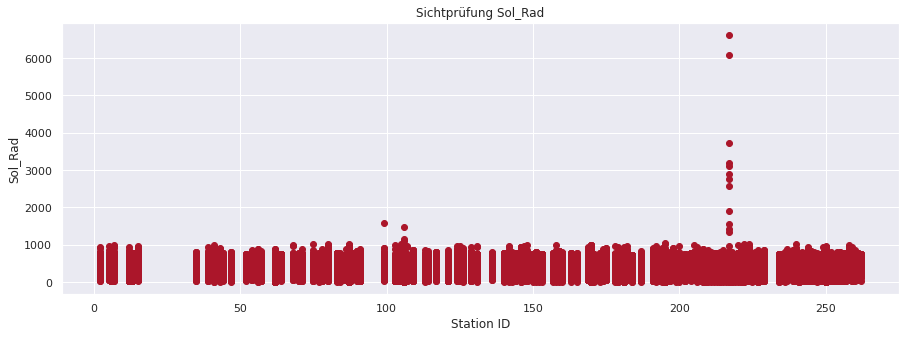

In [ ]:
#Visuelle Prüfung auf Ausreißer anhand eines Scatterplots Sol_Rad
fig, ax = plt.subplots(figsize = (15,5))
ax.scatter(df['Stn_Id'], df['Sol_Rad'])

ax.set_xlabel('Station ID')
ax.set_ylabel('Sol_Rad')
plt.title("Sichtprüfung Sol_Rad")
plt.show()

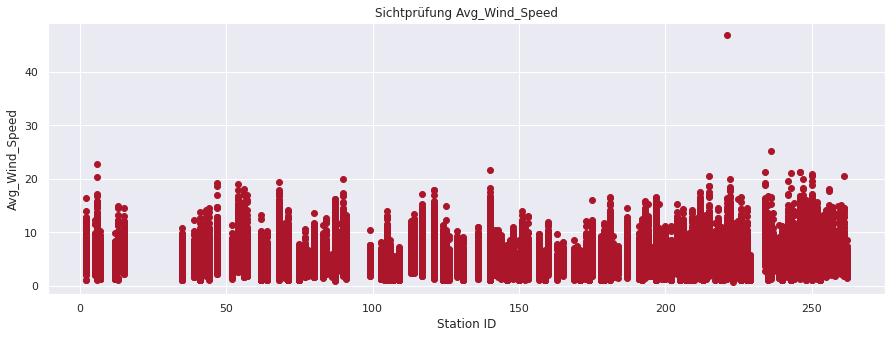

In [ ]:
#Visuelle Prüfung auf Ausreißer anhand eines Scatterplots Avg_Wind_Speed
fig, ax = plt.subplots(figsize = (15,5))
ax.scatter(df['Stn_Id'], df['Avg_Wind_Speed'])

ax.set_xlabel('Station ID')
ax.set_ylabel('Avg_Wind_Speed')
plt.title("Sichtprüfung Avg_Wind_Speed")
plt.show()

Für die Sichtproben wurden bewusst Scatterplots und keine Boxplots herangezogen, um die Extremwerte/Ausreißer in das Verhältnis zu den einzelnen Messtationen setzen zu können.
So lassen sich mit Hilfe des Scatterplots lassen sich im Falle von Sol_Rad zwei Extremwerte an derselben Messtations ausmachen. Für Avg_Wind_Speed ist eine Beobachtung an einer Messtation auffällig.

Für die beschriebenen Werte beider Variablen wird aufgrund der extremen und seltenen Werte an nur einer Messtation von Messfehlern ausgegangen. Daher wird eine Ausreißerbereinigung als nötig angesehen und soll in den folgenden Schritten durchgeführt werden.

Die Ausreißer sollen mittels des Z-Wertes bereinigt werden. Z-Werte arbeiten, im Gegensatz zur Ausreißerbereinigung auf Basis des Interquartilsabstands, mit der Standardabweichung. Hierbei werden mittels der Z-Transformation metrische Werte auf eine Skala übertragen, wobei der Z-Wert den Abstand zum Mittelwert des jeweiligen Merkmals angibt. Aus dem Z-Wert lässt sich auch der Konfidenzintervall ableiten. 

Ein Kofidenzintervall ist ein Intervall, welche die Lage eines Parameters einer Grundgesamtheit zu einer bestimmten Wahrscheinlichkeit enthält. 
Die Methode des Z-Wertes ist im vorliegenden Anwendungsfall geeigneter, da im späteren Verlauf der Arbeit weiterhin mit Wahrscheinlichkeiten gearbeitet werden soll. Daher wurde dieser Methode gegenüber dem Interquartilsabstand dem Vorzug gegeben.


Da im Jahr 2020 neue Rekorde hinsichtlich der Waldbrände in Kalifornien aufgestellt wurden, werden aufgrund des Domänenwissens auch viele Rekorde hinsichtlich der erfassten Messwerte angenommen. Weiterhin sollen die möglichen Zusammenhänge zwischen sehr hohen Werten (bsw. warmen Temperaturen) und der abhängigen Variable Target (Waldbrandausbruch) nicht verfälscht werden.
Daher soll die Ausreißerbereinigung zwar erfolgen um offensichtliche Messfehler oder unrealtisische Werte auszufiltern, jedoch sollen relativ viele Werte behalten werden, da extremere Werte aufgrund des Klimawandels und den damit einhergehenden Veränderungen als plausibel angesehen werden.

In der Fachliteratur werden vielfach Z-Werte von 3 verwendet um Ausreißer zu bereinigen. Aufgrund der eben genannten Gründe, sollen jedoch Ausreißer ab einem Z Wert von 4,5 bereinigt werden, wodurch auch ein höheres Konfidenzintervall von ***99,99366%*** erreicht wird.

Es sollen nur metrische Messwerte breinigt werden. Die nicht-numerische Merkmale, die Lokationsdaten und die abhängige Variable sollen nicht bereinigt werden.


Quellen: https://datascience.eu/de/mathematik-statistikatik/was-ist-ein-z-score/
https://mpl.loesungsfabrik.de/blog/methodenvalidierung/konfidenzintervall
https://statistikgrundlagen.de/ebook/chapter/z-standardisierung/
https://www.statistikpsychologie.de/z-transformation/

In [ ]:
# Zunächst Split des Dataframes zur Ausreißerbeireinigung
# Bereinigung des Teil-DFs 
# Anschließender Merge der DFs
# Prüfung mit df.head()
# Lösung:
# https://stackoverflow.com/questions/72040940/removing-outliers-in-a-df-containing-mixed-dtype


df_outlier = df.loc[:, ~df.columns.isin(['Stn_Name', 'CIMIS_Region', 'Date', 'Stn_Id', 'Target', 'Lat','Long'])]
df_outlier = df_outlier[
    (np.abs(stats.zscore(df_outlier)) < 4.5).all(axis=1)
]

df = df[df.index.isin(df_outlier.index)]

df.head()


,Stn_Id,Stn_Name,CIMIS_Region,Date,ETo,Precip,Sol_Rad,Avg_Vap_Pres,Max_Air_Temp,Min_Air_Temp,...,Max_Rel_Hum,Min_Rel_Hum,Avg_Rel_Hum,Dew_Point,Avg_Wind_Speed,Wind_Run,Avg_Soil_Temp,Target,Lat,Long
0,2,FivePoints,San Joaquin Valley,2018-01-01,0.060,0.000,219.000,7.300,63.400,35.300,...,82.000,46.000,65.000,36.600,3.300,78.300,51.100,0,36.336,-120.113
1,2,FivePoints,San Joaquin Valley,2018-01-02,0.040,0.000,127.000,7.400,59.800,37.700,...,80.000,52.000,67.000,36.700,3.100,74.500,51.300,0,36.336,-120.113
2,2,FivePoints,San Joaquin Valley,2018-01-03,0.040,0.000,125.000,8.400,61.100,37.300,...,79.000,49.000,68.000,39.900,4.500,107.500,51.300,0,36.336,-120.113
3,2,FivePoints,San Joaquin Valley,2018-01-04,0.070,0.010,219.000,11.600,69.200,48.700,...,94.000,52.000,74.000,48.500,5.800,140.200,53.000,0,36.336,-120.113
4,2,FivePoints,San Joaquin Valley,2018-01-05,0.070,0.000,239.000,12.700,73.800,47.500,...,94.000,49.000,72.000,50.800,4.200,101.400,54.400,0,36.336,-120.113


In [ ]:
#Erneute Ausführung von df.describe() um die Maximalwerte nach Bereinigung zu prüfen
df.describe()

,Stn_Id,ETo,Precip,Sol_Rad,Avg_Vap_Pres,Max_Air_Temp,Min_Air_Temp,Avg_Air_Temp,Max_Rel_Hum,Min_Rel_Hum,Avg_Rel_Hum,Dew_Point,Avg_Wind_Speed,Wind_Run,Avg_Soil_Temp,Target,Lat,Long
count,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000,125040.000
mean,157.191,0.158,0.026,461.458,11.266,75.309,48.417,61.162,85.110,40.000,61.318,45.959,4.271,102.500,62.787,0.033,36.415,-119.910
std,72.559,0.086,0.100,194.772,4.061,14.671,11.437,12.377,16.175,20.408,20.049,10.603,1.917,46.014,10.664,0.177,2.299,2.138
min,2.000,0.000,0.000,0.000,1.300,24.900,-2.700,13.000,12.000,0.000,6.000,-3.100,0.700,16.200,31.500,0.000,32.628,-124.243
25%,99.000,0.080,0.000,303.000,8.400,64.100,41.000,52.800,78.000,23.000,46.000,40.000,3.000,71.600,54.400,0.000,34.256,-121.741
50%,171.000,0.160,0.000,474.000,11.200,74.400,48.700,60.100,91.000,37.000,63.000,47.500,3.800,92.200,62.800,0.000,36.597,-120.591
75%,219.000,0.230,0.000,635.000,14.000,86.000,55.800,69.100,97.000,55.000,78.000,53.500,5.100,121.800,70.800,0.000,38.122,-118.095
max,262.000,0.490,0.950,1334.000,29.600,123.700,93.400,106.500,100.000,100.000,100.000,75.000,13.500,324.500,96.900,1.000,41.959,-114.634


Bei den Variablen Sol_Rad, Avg_Wind_Speed und Wind_Run lassen sich nun veränderte Maxima feststellen, welche deutlich näher an den 75%-Quartilen liegen. Die Ausreißerbereinigung war somit erfolgreich.

Die Prüfung und Entfernung der fehlende Werte, Dubletten und Ausreißer ist somit abgeschlossen. Im folgenden Abschnitt soll die Datenqualität nach diesen Schritten näher untersucht werden.

# WIND_RUN rauswerfen!

In [ ]:
# Kopie des DataFrames anlegen für späteres historisches Feature Engineering

df_history = copy.deepcopy(df)

###2.4.4 Datenqualität

In diesem Abschnitt soll die Datenqualität näher untersucht werden. Hierbei werden die Ursprungsdaten mit den bereinigten Daten verglichen und entsprechende Veränderungen bewertet. 
Weiterhin sollen bestehende Aufälligkeiten einzelner Variablen herausgestellt werden um das weitere Vorgehen im Abschnitt "Datenexploration" hinsichtlich dieser zu ermitteln. 

Kurze Zusammenfassung des Kapitels und auf jetzige Datenqualität eingehen
* Kurzer Abriss, dass die Daten nun keine fehlenden Werte / Dubletten haben
* Wie viel Daten wurden verloren? df.shape()
* Liegen Herrausforderungen/Hindernisse vor? (Target sieht schief aus und wird näher betrachtet!)

In [ ]:
#Ermittlung Anzahl Beobachtungen nach Datenbereeinigung
df.shape

(125040, 21)

Nach der Bereinigung des Datensatzes liegen nun 125040 Beobachtungen vor. 

# 3. Datenexploration

In diesem Kapitel sollen erste Zusammenhänge aus dem Datensatz erschlossen werden. Daher wird zunächst die Zielvariable "Target" untersucht, um mögliche Schlussfolgerungen zu ermitteln.
Anschlißenend werden Univariate und Bivariate Auswertungen erstellt, um weitere Inferenz zu schaffen.

##3.1 Zielvariable Target
Aufgrund der Auffälligkeiten im vorherigen Kapitel und um weiteres inhaltliches Verständnis zu schaffen, soll in diesem Abschnitt die abhängige Variable "Target" näher univariat untersucht werden.

* Visualisierung noch nötig??? Vielleicht prozentuale Verteilung?


Die Zielvariable "Target" definiert, unter welchen Prädiktoren und in welchen Ausmaß dieser, ein Waldbrand entstanden ist. Hierbei bedeutet der Wert 1, dass zu diesen Ausprägungen der Prädiktoren ein Waldbrand entstanden ist. Der Wert 0 repräsentiert hingegen das Szenario, dass kein Waldbrand ausgebrochen ist.

*   Waldbrand: 1
*   kein Waldbrand: 0

Zunächst werden unter der Verwendung der Kalifornien-Landkarte, die verschiedenen Messstantion-Standorte visualisiert und den Standorten die Wahrscheinlichkeit eines Waldbrandes zugewiesen. Je größer der Punkt in der Visualisierung ist, desto höher ist die Wahrscheinlichkeit eines Waldbrandausbruchs.

*To-Do: Erläuterung GeoPandas Package zur Visualisierung von GIS*


           Stn_Name  Target    Lat     Long
0        FivePoints      42 36.336 -120.113
1           Shafter      30 35.533 -119.282
2             Davis      23 38.536 -121.776
3  Firebaugh/Telles      35 36.851 -120.591
4            Durham      41 39.609 -121.824


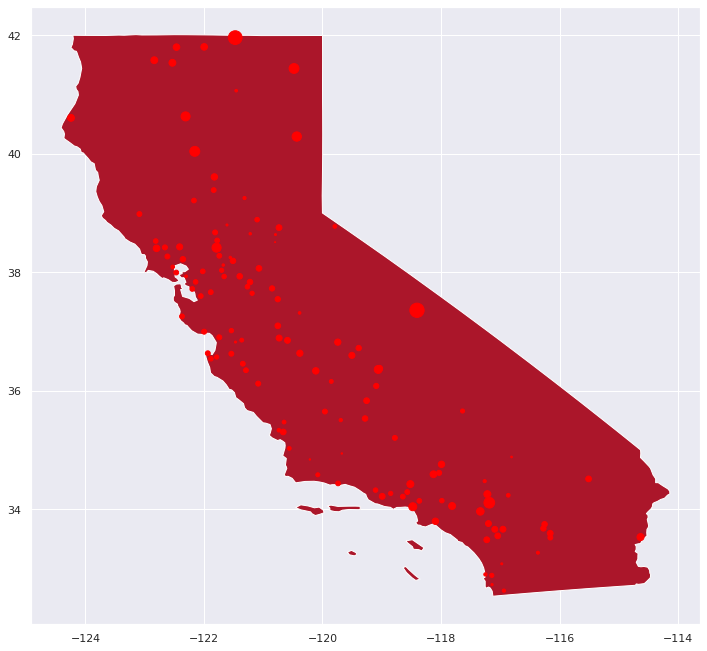

In [ ]:
#Neues Dataframe mit der Variable Target anlegen und den Index resetten
df_neu = df[df['Target']==1]
df_neu.reset_index(drop=True)

#Dataframe aggregieren, so dass jeweils einmal die Station mit den Längen- und Breitengrad berücksichtigt wird, um die Lokationen zu visualisieren
df_group = df_neu.groupby('Stn_Name', as_index=False, sort=False).agg({'Target':'sum', 'Lat':'first', 'Long': 'first'})

#Prüfen, ob richtig gruppiert wurde:
print(df_group.head())

#Mithilfe von Geopanda ein GeoDataFrame anlegen
#x-Variable mit Längegrad (Long) und y-Variable mit Breitengrad (Lat) besetzen
gdf = gpd.GeoDataFrame(
    df_group, geometry=gpd.points_from_xy(df_group.Long, df_group.Lat))

#Geometrische Daten der USA laden:
states = gpd.read_file('/vsicurl/https://github.com/joncutrer/geopandas-tutorial/raw/master/data/usa-states-census-2014.shp')

#Die ersten 5 Zeilen des Datensatzes aufrufen:
states.head()

#Die Variable "NAME" nach "California" filtern und die Kalifornien-Karte plotten
ax = states[states['NAME'] == 'California'].plot(figsize=(12, 12))

#Visualisierungsausprägung hinterlegen
gdf.plot(ax=ax, color='red', markersize=gdf["Target"])

#Visualsierung anzeigen
plt.show()

In [ ]:
#Absolute Anzahl Target
target_values= df.groupby(['Target'])["Target"] # Eventuell Count statt describe?
target_values.describe()

,count,mean,std,min,25%,50%,75%,max
Target,,,,,,,,
0,120972.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,4068.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000


In [ ]:
#Anteil von 0 und 1 von Target in Prozent
target_counts = df["Target"].value_counts(normalize=True)
print(target_counts)

0   0.967
1   0.033
Name: Target, dtype: float64


In [ ]:
print('Schiefe: ', skew(df['Target']))

Schiefe:  5.269828340956806


Bei skewness = 0 sind die Daten normalverteilt.
Wenn skewness > 0, dann werden die Daten auf der linken Seite der Verteilung stärker gewichtet.
Wenn skewness < 0, dann werden die Daten auf der rechten Seite der Verteilung stärker gewichtet.

https://www.delftstack.com/de/api/scipy/scipy-stats-skew/

##3.2 Univariate Datenanalyse
Beschreibung der Boxplots und den Histogrammen :)

Beschreibung der Skalen

Quellen:
* https://www.python-graph-gallery.com/24-histogram-with-a-boxplot-on-top-seaborn
* https://www.codegrepper.com/search.php?answer_removed=1&q=python%20subplot%20in%20subplot

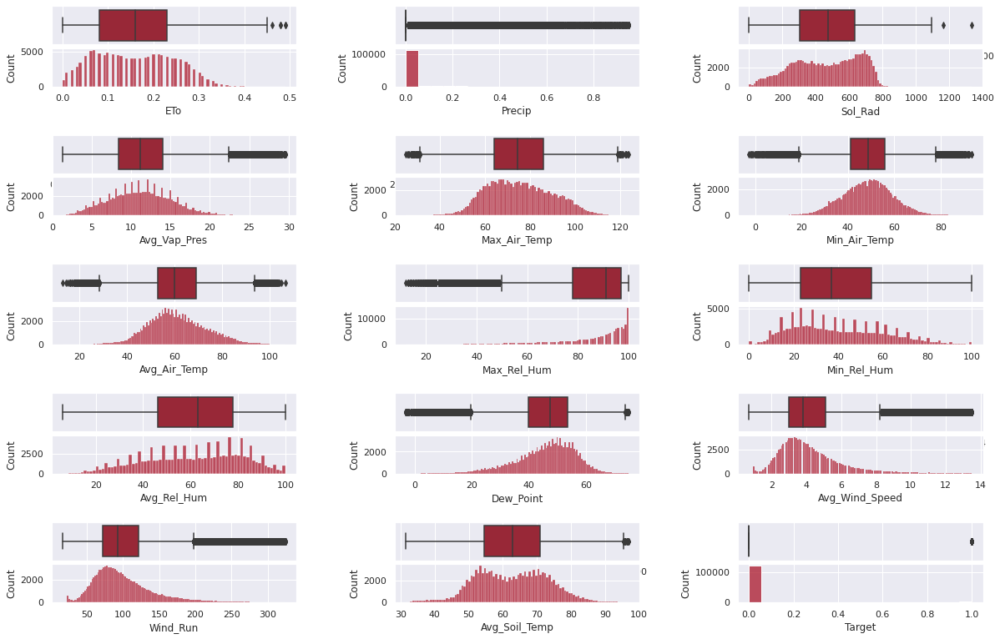

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

df_numeric = df.loc[:, ~df.columns.isin(['Stn_Name', 'CIMIS_Region', 'Date', 'Stn_Id'])]

fig = plt.figure(figsize=(20, 16))
outer = gridspec.GridSpec(6, 3, wspace=0.4, hspace=0.6)

for i in range(15):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)
        
     
    column_name = df_numeric.columns[i]      
      # creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
        
    ax = plt.Subplot(fig, inner[0])
    sns.boxplot(x=df_numeric[column_name], ax=ax)
    fig.add_subplot(ax)

    ax_hist = plt.Subplot(fig, inner[1])
    sns.histplot(x=df_numeric[column_name], ax=ax_hist)
    fig.add_subplot(ax_hist)

fig.show()

##3.3 Bivariate Datenanalyse

Nachdem die univariaten Analysen nun abgeschlossen sind, sollen in diesem Abschnitt die Variblen auf Verhältnis und Zusammenhänge untersucht werden.

Zunächst werden hier Korrelationen anhand einer Heatmap betrachtet. Anschließend wird ein Pairplot erstellt und ausgewertet um weitere Zusammenhänge darzustellen.
Anschließend sollen die Beziehungen der abhängige Variable Target gesondert untersucht werden.

Hier eine gute Seite, für eine erste lineare Regression:
https://www.statology.org/bivariate-analysis-in-python/

Eventuell bei den Variablen mit starker Korrelation einmal anwenden?

###3.3.1 Korrelationen

Die Korrelationen sollen aufgrund der Übersichtlichkeit anhand einer Heatmap dargstellt werden. Abschließend sollen die 10 stärksten positiven, wie negativen Korrelationen in einer Tabelle aufgelistet werden.

Std_Id wurde bei der Auswertung entfernt, da die Kennziffer keinerlei statistischen Mehrwert bietet.
Die nicht-numerischen Variablen werden ebenfalls nicht angezeigt, da eine Korrelation nicht erstellbar ist.

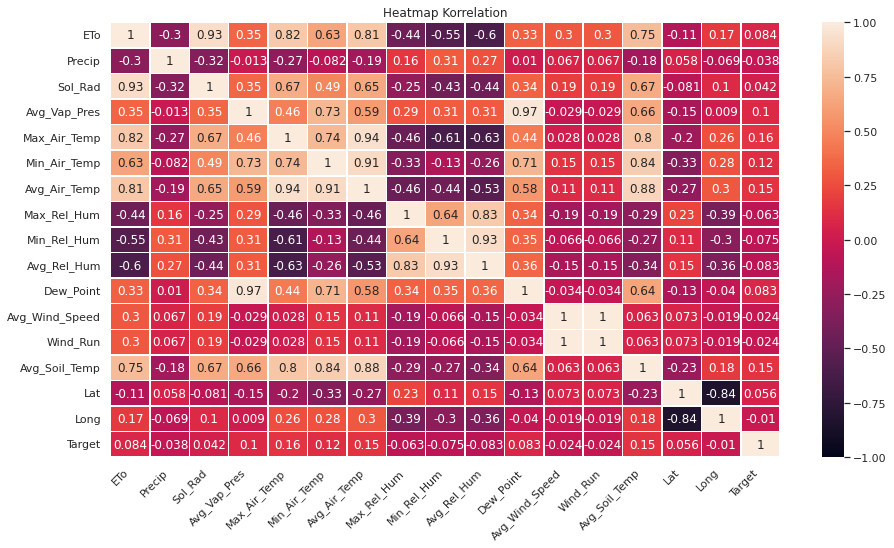

In [ ]:
#Erstellung einer Heatmap mit eingeblendeten Korrelationen
#Enthalten: Neuordnung des Dataframes, damit Target an letzter Stelle steht und ganz rechts in der Visualisierung auftaucht
sns.set()
sns.set(rc = {'figure.figsize':(15,8)})
corr_df = df[['ETo','Precip','Sol_Rad','Avg_Vap_Pres','Max_Air_Temp','Min_Air_Temp','Avg_Air_Temp','Max_Rel_Hum','Min_Rel_Hum','Avg_Rel_Hum','Dew_Point','Avg_Wind_Speed','Wind_Run','Avg_Soil_Temp','Lat','Long','Target']]
ax= sns.heatmap(corr_df.corr(), vmin = -1, vmax = +1, annot = True, linewidths=.5)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.title("Heatmap Korrelation")
plt.show()

In [ ]:
#Anzeigen der 10 stärksten positiven und negativen Korrelationen
def max_correlation (df,n):
    corr_matrix = df.corr()
    correlation = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
    correlation = pd.DataFrame(correlation).reset_index()
    correlation.columns=["Variable_1","Variable_2","Korrelation"]
    correlation = correlation.reindex(correlation.Korrelation.abs().sort_values(ascending=False).index).reset_index().drop(["index"],axis=1)
    return correlation.head(n)

max_correlation(df,10)

#https://www.appsloveworld.com/pandas/100/1/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas # Zweiter Kommentar

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


,Variable_1,Variable_2,Korrelation
0,Avg_Wind_Speed,Wind_Run,1.000
1,Avg_Vap_Pres,Dew_Point,0.970
2,Max_Air_Temp,Avg_Air_Temp,0.940
3,Min_Rel_Hum,Avg_Rel_Hum,0.926
4,ETo,Sol_Rad,0.926
5,Min_Air_Temp,Avg_Air_Temp,0.906
6,Avg_Air_Temp,Avg_Soil_Temp,0.876
7,Min_Air_Temp,Avg_Soil_Temp,0.843
8,Lat,Long,-0.840
9,Max_Rel_Hum,Avg_Rel_Hum,0.826


Hervorzuheben ist die besonders starke Korrelation von 1 zwischen Avg_Wind_Speed und Wind_Run. Bei Wind_Run handelt es sich allerdings um eine berechnete Variable, welche nicht von Sensoren erhoben wurde. Durch die Verbindung von Domänenwissen und  Korrelation ist davon auszugehen, dass die Variable Wind_Run anhand von Avg_Wind_Speed berechent wurde. 

Weiterhin enthält das Domänenwissen, dass der Taupunkt (Dew_Point) stark mit der Lufttemperatur zusammenhängt, was durch die Werte bestätigt wird.
Die Werte an Position 2, 3, 5 und 9 sind Durchschnittswerte, die mit dem Minimum bzw. Maximum korrelieren, was mathematisch-logisch gegeben ist.

* 4 -> Domänenwissen
* 6 & 7 -> Domänenwissen? Jedenfalls nicht überraschend
* 8 -> nun.... Gleicher Bundesstaat? Messstationen sind nicht gleichverteilt?


###3.3.2. Pairplot

Text(0.5, 1.0, 'Pairplot mit allen Variablen')

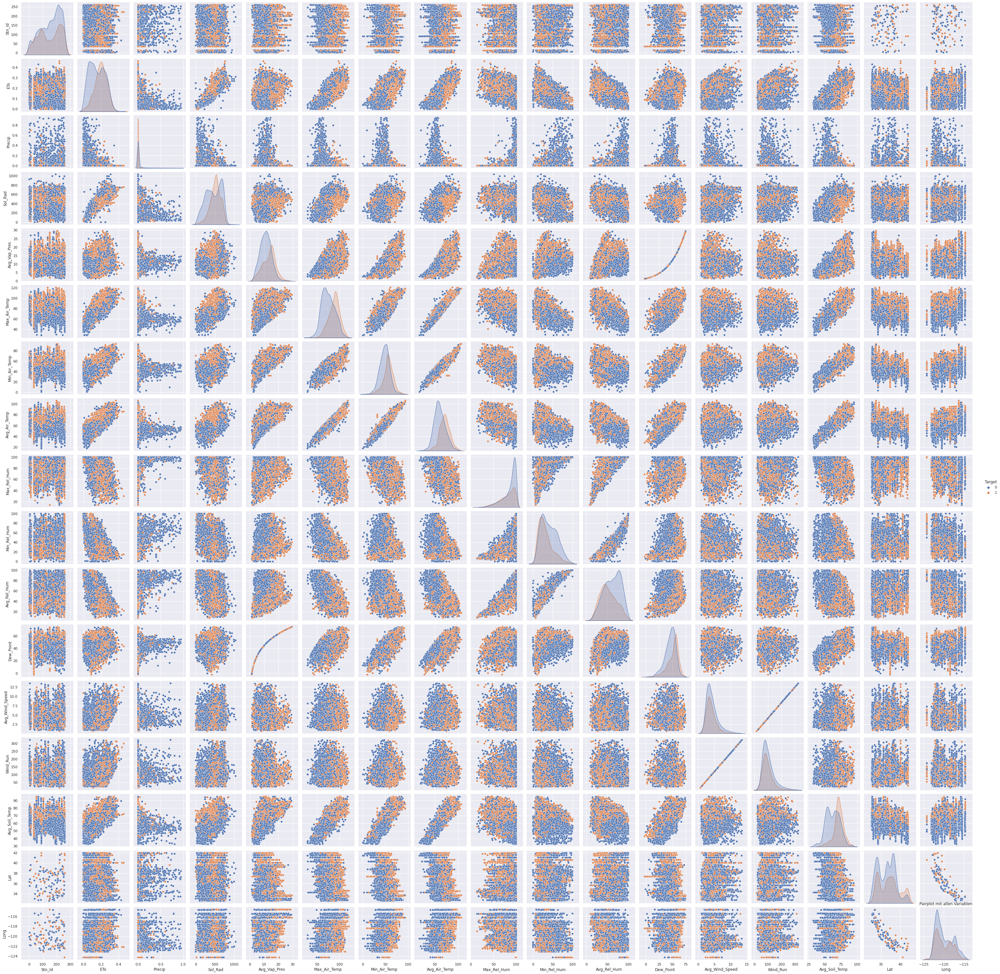

In [ ]:
#Erstellung von Liste 1 gefiltert auf Target = 1 

df_is_positive = df[df['Target']==1]
df_is_positive.head()

#Erstellung von Liste 2 gefiltert auf 5% von Target = 0 inkl. Suffle des Datensatzes 
df_is_negative = df[df['Target']==0]
df_is_negative = shuffle (df_is_negative, random_state= random_state)
df_is_negative = df_is_negative.iloc[0: round(df_is_negative.shape[0]*0.05),:]
df_is_negative.head()

# Zusammenführung von Liste 1 und 2
df_pair = pd.concat([df_is_negative, df_is_positive], ignore_index=True)
df_pair = shuffle (df_pair, random_state= random_state)
# Erstellung des Pairplots
sns.pairplot(df_pair, hue="Target")
plt.title("Pairplot mit allen Variablen")

#4. Feature Engineering

##4.1 Feature Encoding:
- Nominale Features, wie Stationsname oder Region müssen codiert werden
- Datumsfeature muss auch transformiert und codiert werden
- Ziel ist eine numerische Repräsentation


###4.1.1 Nominal Feature Encoding:
- Stn_name und CimisRegion muss encodiert werden
- OneHotEncoding bietet sich unter den Möglichkeiten an

https://www.researchgate.net/publication/353857384_A_Deep-Learned_Embedding_Technique_for_Categorical_Features_Encoding

https://analyticsindiamag.com/a-complete-guide-to-categorical-data-encoding/




In [ ]:
df.columns

Index(['Stn_Id', 'Stn_Name', 'CIMIS_Region', 'Date', 'ETo', 'Precip',
       'Sol_Rad', 'Avg_Vap_Pres', 'Max_Air_Temp', 'Min_Air_Temp',
       'Avg_Air_Temp', 'Max_Rel_Hum', 'Min_Rel_Hum', 'Avg_Rel_Hum',
       'Dew_Point', 'Avg_Wind_Speed', 'Wind_Run', 'Avg_Soil_Temp', 'Target',
       'Lat', 'Long'],
      dtype='object')

In [ ]:
# Deklariere OneHotEncoding für Stationsname und CIMIS Region
encoder=ce.OneHotEncoder(cols=["Stn_Name","CIMIS_Region"],handle_unknown='return_nan',return_df=True,use_cat_names=True)

# Encoding der Features
df = encoder.fit_transform(df)

# Löschen der Stations ID, diese wird nicht mehr benötigt, da die Information im OneHotEncoding enthalten ist

df = df.drop(labels=['Stn_Id'], axis=1)

##4.1.2 Cylic Feature Encoding:
- Datums- und Zeitanagben können nicht einfach so in einen numerischen Wert übersetzt werden
- Minute 59 in einer Stunde ist ähnlicher zu Minute 1, was durch eine einfache Übersetzung in einen Wert von 0 bis 60 nicht abgebildet werden kann
- Cyclische Features werden daher in einer Kombination aus Sinus und Cosinus encodiert


### Features aus einem Datum ableiten
- Aus dem Datum können folgende Features extrahiert werden
- Tag in der Woche, Monat und Jahr
- Monat im Jahr
- Quartal des Datums
- Jahr (sollte hier nicht beachtet werden. BEGRÜNDUNG, Jahr kommt nicht wieder vor, Zeit ist auch zu kurz, um daraus nen langfristigen trend ableiten zu können)
- Welche Granularität der Features sinnvoll für eine Vorhersage ist, muss später geklärt werden



https://ianlondon.github.io/blog/encoding-cyclical-features-24hour-time/


In [ ]:
def date_transformation(df):
  # Aufsplittung vom datum in einzelne Spalten
  df['month'] = pd.DatetimeIndex(df['Date']).month
  df['quarter'] = pd.DatetimeIndex(df['Date']).quarter
  df['day_in_week'] = pd.DatetimeIndex(df['Date']).day_of_week
  df['day_in_month'] = pd.DatetimeIndex(df['Date']).day
  df['day_in_year'] = pd.DatetimeIndex(df['Date']).day_of_year

  # Verarbeitung der Rohdaten in Sinus/Cosinus Encodierung
  # Monate im Jahr
  month_in_a_year = 12


  df['sin_month'] = np.sin(2*np.pi*df['month']/month_in_a_year)
  df['cos_month'] = np.cos(2*np.pi*df['month']/month_in_a_year)

  # Quarter im Jahr
  quater_in_a_year = 4

  df['sin_quater'] = np.sin(2*np.pi*df['quarter']/quater_in_a_year)
  df['cos_quater'] = np.cos(2*np.pi*df['quarter']/quater_in_a_year)


  # Tag in der Woche
  day_in_week = 7

  df['sin_weekday'] = np.sin(2*np.pi*df['day_in_week']/day_in_week)
  df['cos_weekday'] = np.cos(2*np.pi*df['day_in_week']/day_in_week)

  # Tage eines Monats
  days_in_a_month = 31

  df['sin_days'] = np.sin(2*np.pi*df['day_in_month']/days_in_a_month)
  df['cos_days'] = np.cos(2*np.pi*df['day_in_month']/days_in_a_month)

  # Tag im Jahr
  day_in_year = 365

  df['sin_yearday'] = np.sin(2*np.pi*df['day_in_year']/day_in_year)
  df['cos_yearday'] = np.cos(2*np.pi*df['day_in_year']/day_in_year)

  # Entfernen der Rohdatenspalten
  df.drop(['Date','month','quarter','day_in_week','day_in_month','day_in_year'], axis=1, inplace=True)

  return df



In [ ]:
df = date_transformation(df=df)

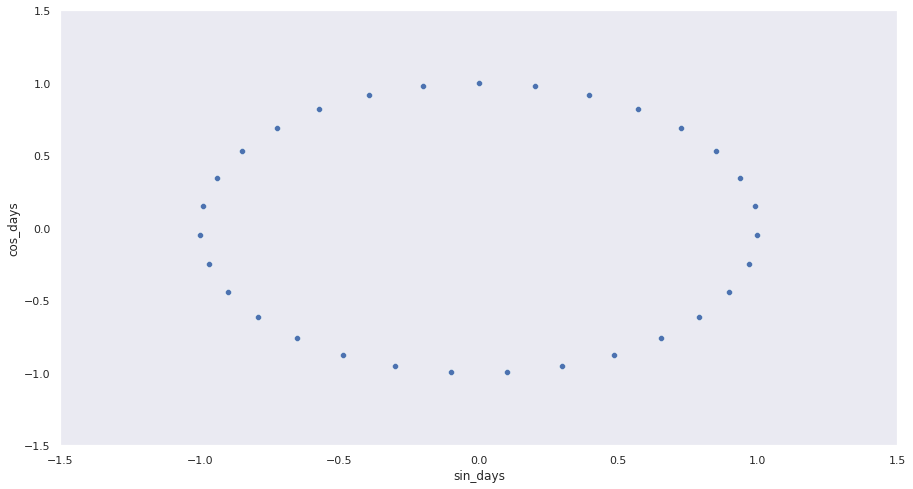

In [ ]:
#Test Visualisierung der Encodierung von Tage eines Monats
sns.set_style('dark')

fig, ax = plt.subplots()
sns.scatterplot(x=df['sin_days'], y=df['cos_days'], ax = ax)
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
plt.show()




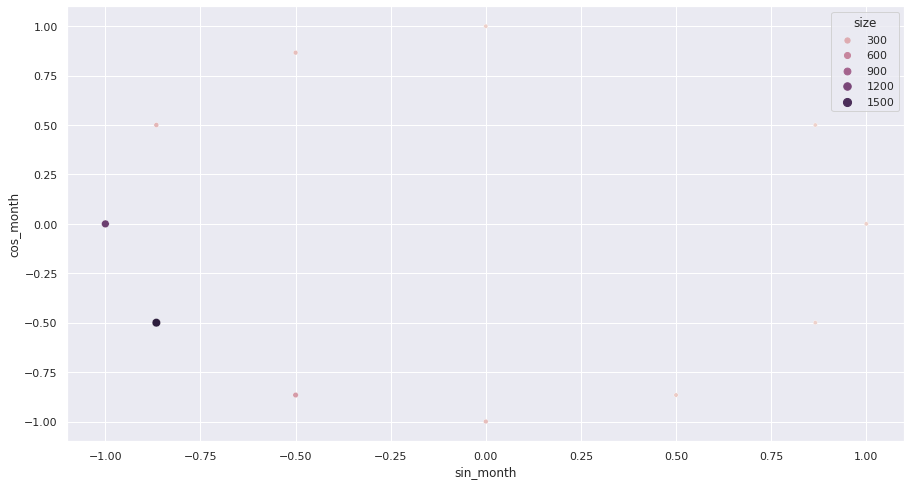

In [ ]:
#Monatswerte in Abhängigkeit zum Taget auf einem Scatterplot
sns.set_style("darkgrid")
#sns.pairplot(df, hue='Target', vars=['sin_month', 'cos_month', ]);

df_group = df.loc[df['Target'] == 1]
df_group = df_group.groupby(["sin_month", "cos_month"]).size().to_frame('size')
df_group

sns.scatterplot(data=df_group, x='sin_month', y='cos_month', size='size', hue='size')

#TODO: Grenzen der Farben bestimmen? Brennt es nur in 2 Monaten?

#5. Analyse / Maschinelles Lernen

##5.1 Train/Test Split

- Datenset extrem unausgeglichen (Hier nochmal Verhältnis zeigen)
- Problem wurde oben schon beschrieben


Lösungsideen:
https://datascience.stackexchange.com/questions/32818/train-test-split-of-unbalanced-dataset-classification



In [ ]:
# Simple Implementation for Test/Train Split

X = df.loc[:, df.columns != "Target"].values
y = df["Target"].values

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)
for train_index, test_index in skf.split(X, y):
     print("TRAIN:", len(train_index), "TEST:", len(test_index))
     X_train, X_test = X[train_index], X[test_index]
     y_train, y_test = y[train_index], y[test_index]



TRAIN: 100032 TEST: 25008
TRAIN: 100032 TEST: 25008
TRAIN: 100032 TEST: 25008
TRAIN: 100032 TEST: 25008
TRAIN: 100032 TEST: 25008


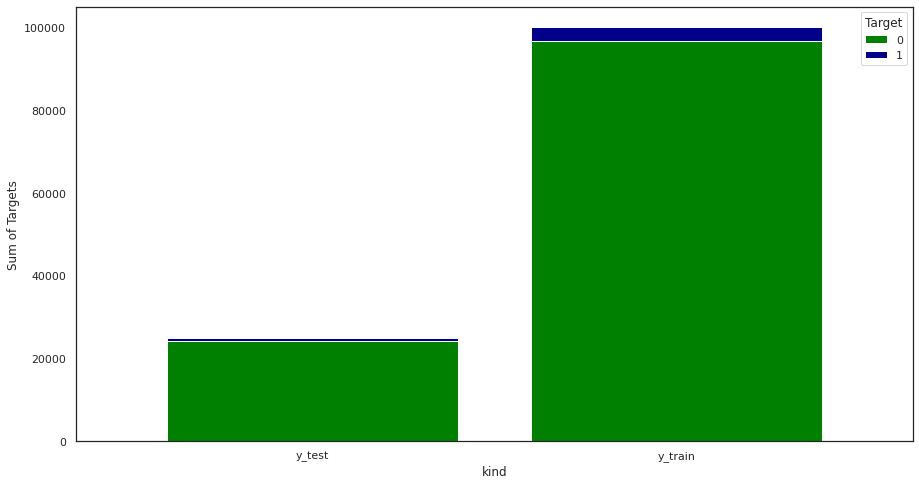

In [ ]:
# Visualisierung Test & Trainingsdaten

df_y_train = pd.DataFrame(y_train,   
              columns= ['Target'] 
 )

df_y_train['kind'] = "y_train"

df_y_test = pd.DataFrame(y_test,   
             columns= ['Target'] )

df_y_test['kind'] = "y_test"

df_y = pd.concat([df_y_train, df_y_test], ignore_index=True)

df_y.head()

df_group = df_y.groupby(["Target", "kind"]).size().to_frame('size')

sns.set_style('white')

(df_y.groupby(["kind", "Target"])
.Target
.count()
.unstack()
).plot(kind='bar', stacked = True, color = ['green', 'darkblue'], width=0.8)

plt.xticks(rotation=0)
plt.ylabel('Sum of Targets');



## 5.2. Feature Transformation
- Einige Klassifikatoren kommen mit einheitlich skalierten Werten der Features wesentlich besser zurecht. 
- Skalierung nach Normalverteilung? (wahrscheinlich eher ungünstig mit OneHotEncoding)
- Skalierung zwischen 0 und 1 wahrscheinlich besser. 
- Oder doch RobustScaler?  (haben wir viele Outlier?)
 
- Problem: Sinus/Cosinus Skalierung - Ist es sinnvoll die auch zwischen 0 und 1 zu skalieren?

https://scikit-learn.org/stable/modules/preprocessing.html#preprocessing

https://www.geeksforgeeks.org/standardscaler-minmaxscaler-and-robustscaler-techniques-ml

https://stackoverflow.com/questions/35723472/how-to-use-sklearn-fit-transform-with-pandas-and-return-dataframe-instead-of-num




Im Rahmen des Maschinellen Lernen nimmt Feature Transformation, die Vorverarbeitung von den Modellvariablen, eine wesentliche Rolle ein. Mithilfe von Feature Scaling werden numerische Merkmale in einheitliches Schema transformiert, um die Variablen vergleichbar zu machen. Dies kann mithilfe der einer Standardisierung oder Normalisierung erreicht werden. Die Variablen im vorliegenden Modell werden unter der Anwendung des MinMaxScalers normalisiert. Der MinMaxScaler skaliert die unabhängigen Variablen in einem Wertebereich von 0 und 1. 

*ToDo: Ausführen, wieso sich für den MinMaxScaler entschieden wurde.*

In [ ]:
# TODO! - Entscheidung und Implementierung der Skalierung (Louise + Niklas)
# MinMaxScaler importieren 
from sklearn.preprocessing import MinMaxScaler
# Skalierung zwischen 0 und 1 festlegen
scaler = MinMaxScaler(feature_range = (0,1))
df_column_names = df.columns
scaled = scaler.fit_transform(df[df.columns])

df = pd.DataFrame(scaled, columns= df_column_names)
# Die ersten fünf Zeilen des normalisierten Dataframes anzeigen lassen:
df.head()



,Stn_Name_FivePoints,Stn_Name_Shafter,Stn_Name_Davis,Stn_Name_Firebaugh/Telles,Stn_Name_Durham,Stn_Name_Camino,Stn_Name_Stratford,Stn_Name_Bishop,Stn_Name_Parlier,Stn_Name_Calipatria/Mulberry,...,sin_month,cos_month,sin_quater,cos_quater,sin_weekday,cos_weekday,sin_days,cos_days,sin_yearday,cos_yearday
0,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.500,1.000,0.601,0.990,0.509,1.000
1,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.901,0.802,0.697,0.959,0.517,1.000
2,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,1.000,0.357,0.786,0.910,0.526,0.999
3,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.723,0.000,0.863,0.844,0.534,0.999
4,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.277,0.000,0.925,0.764,0.543,0.998


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import f1_score,  balanced_accuracy_score, accuracy_score, confusion_matrix



# Ignore ConverganceWarning 
warnings.filterwarnings('ignore', category=ConvergenceWarning) # BEGRÜNDUNG

# Test Train Split with stratified
X_train, X_test, y_train, y_test = train_test_split(df.loc[:, df.columns != 'Target'], df["Target"], test_size=0.2, shuffle=True, random_state=random_state, stratify=df["Target"])

classifier = [
    KNeighborsClassifier(),
    LogisticRegression( random_state=random_state,
         class_weight= "balanced"),
    DecisionTreeClassifier(random_state=random_state ,
                           class_weight= "balanced"),
    GaussianNB(),
    SVC(random_state=random_state,
         class_weight= "balanced"),
    RandomForestClassifier(random_state=random_state,
         class_weight= "balanced"),
    HistGradientBoostingClassifier(random_state=random_state)
]

metrics = []

for i in classifier:
    i.fit(X_train, y_train)
    y_pred = i.predict(X_test)
    tn, fp, fn, tp = confusion_matrix(y_true=y_test, y_pred=y_pred).ravel()

    metrics.append(
        {
            "classifier": i.__class__.__name__,
            "accuracy": accuracy_score(y_true=y_test, y_pred=y_pred),
            "balanced_accuracy": balanced_accuracy_score(y_true=y_test, y_pred=y_pred),
            "f1_score": f1_score(y_true=y_test, y_pred=y_pred),
            "false_negativ_rate": fn / (tp+fn),
            "false_discovery_rate": fp /(tp+fp)

        }
    )



In [ ]:
# Merge Metrics list into DataFrame for Visualisation
df_ml_metrics = pd.DataFrame.from_dict(metrics)
df_ml_metrics = df_ml_metrics.sort_values(by='balanced_accuracy', ascending=False)
df_ml_metrics.head(10)

,classifier,accuracy,balanced_accuracy,f1_score,false_negativ_rate,false_discovery_rate
4,SVC,0.883,0.928,0.352,0.023,0.786
1,LogisticRegression,0.823,0.869,0.252,0.082,0.854
2,DecisionTreeClassifier,0.978,0.820,0.662,0.349,0.327
6,HistGradientBoostingClassifier,0.981,0.750,0.638,0.498,0.128
5,RandomForestClassifier,0.981,0.715,0.592,0.570,0.049
3,GaussianNB,0.279,0.612,0.080,0.031,0.958
0,KNeighborsClassifier,0.967,0.575,0.235,0.845,0.514


# Historic Feature Engineering

In [ ]:
# Extend Features to Historic Values

df_extended = pd.DataFrame()

for i in df_history['Stn_Id'].unique():
  
  df_station = df_history.loc[df_history['Stn_Id'] == i]
  df_station = df_station.sort_values("Date")

  # Fügt historische Werte zum DataFrame hinzu
  df_station["historic_precip_sum"] = df_station["Precip"].shift(1).rolling(window=14, min_periods=0).sum()
  df_station["historic_precip_avg"] = df_station["Precip"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_air_temp"] = df_station["Avg_Air_Temp"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_soil_temp"] = df_station["Avg_Soil_Temp"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_eto"] = df_station["ETo"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_hum"] = df_station["Avg_Rel_Hum"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_sol_rad"] = df_station["Sol_Rad"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_dew_point"] = df_station["Dew_Point"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_max_air_temp"] = df_station["Max_Air_Temp"].shift(1).rolling(window=14, min_periods=0).mean()
  df_station["historic_max_hum"] = df_station["Max_Rel_Hum"].shift(1).rolling(window=14, min_periods=0).mean()






  df_extended = df_extended.append(df_station)

df_extended= df_extended.replace(np.nan, 0)

df_extended.head()


,Stn_Id,Stn_Name,CIMIS_Region,Date,ETo,Precip,Sol_Rad,Avg_Vap_Pres,Max_Air_Temp,Min_Air_Temp,...,historic_precip_sum,historic_precip_avg,historic_air_temp,historic_soil_temp,historic_eto,historic_hum,historic_sol_rad,historic_dew_point,historic_max_air_temp,historic_max_hum
0,2,FivePoints,San Joaquin Valley,2018-01-01,0.060,0.000,219.000,7.300,63.400,35.300,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,2,FivePoints,San Joaquin Valley,2018-01-02,0.040,0.000,127.000,7.400,59.800,37.700,...,0.000,0.000,47.800,51.100,0.060,65.000,219.000,36.600,63.400,82.000
2,2,FivePoints,San Joaquin Valley,2018-01-03,0.040,0.000,125.000,8.400,61.100,37.300,...,0.000,0.000,47.500,51.200,0.050,66.000,173.000,36.650,61.600,81.000
3,2,FivePoints,San Joaquin Valley,2018-01-04,0.070,0.010,219.000,11.600,69.200,48.700,...,0.000,0.000,48.300,51.233,0.047,66.667,157.000,37.733,61.433,80.333
4,2,FivePoints,San Joaquin Valley,2018-01-05,0.070,0.000,239.000,12.700,73.800,47.500,...,0.010,0.003,50.425,51.675,0.053,68.500,172.500,40.425,63.375,83.750


In [ ]:
# Encoding und Transformation
# Encoding der Features
df_extended = encoder.fit_transform(df_extended)

# Löschen der Stations ID, diese wird nicht mehr benötigt, da die Information im OneHotEncoding enthalten ist

df_extended = df_extended.drop(labels=['Stn_Id'], axis=1)

In [ ]:
# data Transformation
df_extended = date_transformation(df=df_extended)

In [ ]:
scaler = MinMaxScaler(feature_range = (0,1))
#scaler = StandardScaler()
df_column_names = df_extended.columns
scaled = scaler.fit_transform(df_extended[df_extended.columns])

df_extended = pd.DataFrame(scaled, columns= df_column_names)

df_extended.head()

,Stn_Name_FivePoints,Stn_Name_Shafter,Stn_Name_Davis,Stn_Name_Firebaugh/Telles,Stn_Name_Durham,Stn_Name_Camino,Stn_Name_Stratford,Stn_Name_Bishop,Stn_Name_Parlier,Stn_Name_Calipatria/Mulberry,...,sin_month,cos_month,sin_quater,cos_quater,sin_weekday,cos_weekday,sin_days,cos_days,sin_yearday,cos_yearday
0,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.500,1.000,0.601,0.990,0.509,1.000
1,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.901,0.802,0.697,0.959,0.517,1.000
2,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,1.000,0.357,0.786,0.910,0.526,0.999
3,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.723,0.000,0.863,0.844,0.534,0.999
4,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.750,0.933,1.000,0.500,0.277,0.000,0.925,0.764,0.543,0.998


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import f1_score,  balanced_accuracy_score, accuracy_score, confusion_matrix

classifier = [
    KNeighborsClassifier(),
    LogisticRegression( random_state=random_state,
         class_weight= "balanced"),
    DecisionTreeClassifier(random_state=random_state ,
                           class_weight= "balanced"),
    GaussianNB(),
    SVC(random_state=random_state,
         class_weight= "balanced"),
    RandomForestClassifier(random_state=random_state,
         class_weight= "balanced"),
    HistGradientBoostingClassifier(random_state=random_state)
]

X = df_extended.loc[:, df_extended.columns != 'Target']
y = df_extended["Target"]

# Test Train Split with stratified Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=random_state, stratify=y)

metrics = []

for i in classifier:
    i.fit(X_train, y_train)
    y_pred = i.predict(X_test)
    tn, fp, fn, tp = confusion_matrix(y_true=y_test, y_pred=y_pred).ravel()

    metrics.append(
      {
          "classifier": i.__class__.__name__,
          "accuracy": accuracy_score(y_true=y_test, y_pred=y_pred),
          "balanced_accuracy": balanced_accuracy_score(y_true=y_test, y_pred=y_pred),
          "f1_score": f1_score(y_true=y_test, y_pred=y_pred),
          "false_negativ_rate": fn / (tp+fn),
          "false_discovery_rate": fp /(tp+fp)
      }
    )
         



In [ ]:
# Merge Metrics list into DataFrame for Visualisation
df_ml_metrics = pd.DataFrame.from_dict(metrics)
df_ml_metrics = df_ml_metrics.groupby("classifier").mean()
df_ml_metrics = df_ml_metrics.sort_values(by='balanced_accuracy', ascending=False)
df_ml_metrics.head(30)

,accuracy,balanced_accuracy,f1_score,false_negativ_rate,false_discovery_rate
classifier,,,,,
SVC,0.893,0.935,0.374,0.021,0.769
LogisticRegression,0.843,0.884,0.278,0.072,0.836
DecisionTreeClassifier,0.985,0.877,0.772,0.238,0.217
HistGradientBoostingClassifier,0.986,0.804,0.736,0.391,0.069
RandomForestClassifier,0.986,0.789,0.729,0.423,0.011
GaussianNB,0.323,0.634,0.085,0.034,0.956
KNeighborsClassifier,0.969,0.591,0.280,0.813,0.441


# Hyperparameter Tuning des DecisionTrees

Um die Performance des DecisionTrees noch weiter zu optimieren wird im Folgenden ein zweistufiges Hyperparameter Tuning durchgeführt. 

Dabei wird im ersten Schritt die optimale Anzahl an Features ermittelt. Die Parameterselektion wird mit Hilfe von ```SelectKBest``` durchgeführt, indem die Abhängigkeit einzelner Features zur Zielvariable anhand von ```chi2``` berechnet wird. Die Top n Features mit der größten Abhängigkeit werden für das Training des Modells benutzt. Sinnvoll ist dies, um störende oder wenig beitragende Features aus dem Modell zu entfernen und dies durch weniger Störungen zu optimieren. Besonders bei den rund 190 Features aus unserem codierten Datenset ist eine Prüfung der Variablen wichtig. Getestet werden dabei alle Anzahlen von einem Feature bis hin zu allen Featuren. 

Im zweiten Schritt werden die eigentlichen Hyperparameter des DecisionTrees optimiert. Die Implementierung des DecisionTrees von SKLearn bietet vielseitige Einstellungsmöglichkeiten, wie beispielsweise das Kriterium für den besten Split (Entropy oder Gini) aber auch die maximale Tiefe des Baumes oder die Gewichtung der einzelnen Klassen. 

Methoden wie die GridSearch probieren alle Kombinationsmöglichkeiten an Parametern aus und finden damit mit einem erheblichen Rechenaufwand die beste Parameterkombination. Mit steigender Anzahl der Hyperparameter und deren Auswahlmöglichkeiten steigt auch die Zeit zum finden der besten Kombination. 

Aus dieser Problematik haben sich im Laufe der Zeit optimiertere Methoden ergeben, welche einen Kompromiss zwischen der besten Parameterkombination und der dafür benötigten Rechenleistung sowie Zeit darstellen. 

HalvingGridSearch basiert wie der Name vermuten lässt auf der Halbierung von Möglichkeiten. Dabei wird in mehreren Interationen jeweils nur die besten Parameterkombinationen des Modells in die nächste Iteration überführt. Grundsätzlich steigt mit jeder Iteration auch die Anzahl an Datensätzen, welche für das Training benutzt werden. Dies führt dazu, dass anfänglich viele Modelle mit wenig Daten schnell trainiert werden können. Mit steigender Iteration sowie immer weniger Kandidaten für die beste Parameterkombination und immer mehr Datensätzen, welche genutzt werden können, nähert sich die HalvingGridSearch einem Optimum an. 

Parameter und deren Möglichkeiten werden für das eigentliche Tuning im param_grid definiert. Die einzelnen Schritte (FeatureSelection und DecisionTree) werden hintereinander in einer Pipeline definiert. 


Das eigentliche HalvingGridSearch Objekt wird mit folgenden Werten initialisiert:

*   ```pipe``` (Die vorher festgelegten Schritte der Pipeline)
*   ```param_grif```(Die Möglichen Parameter zur Optimierung)
*   ```factor``` Der Anteil an Modellen, welcher in die nächste Iteration übernommen wird. In diesem Fall werden 50% oder 1/2 der Modelle übernommen
*   ```random_state```Funktion ist bekannt
*   ```cv```CrossValidation. In diesem Fall ein StratifiedKFold mit 3 folds
*   ```error_score``` Der Wert, der einem Modell zugeteilt wird, wenn das Training fehlschlägt
*   ```verbose```, gibt an wieviel Meldungen in der Konsole ausgegeben werden
*   ```n_jobs```Anzahl der Prozesse, die für das Tuning verwendet werden dürfen. In diesem Fall gibt ```-1```an, dass alle verfügbaren Kerne genutzt werden können
*   ```scoring```ist die Angabe der Metrik nach der die besten Modelle ausgewählt werden. Auch hier kommt ```balanced_accuracy``` wieder als primäre Metrik zum Einsatz, um besser abschätzen zu können, wie gut der Classifier auf dem unausgeglichenen Datenset ist


*Disclaimer: Die Optimierung ist sehr Rechenaufwändig und kostet trotz ihrer Optimierung durch die Halbierung der Möglichkeiten sehr viel Zeit.*


In [ ]:
# TODO: Auto Parameter Tuning 
# 2. HalvingGrid Search? HalvingRandom Search? Training mit vollem Datensatz für CV etc.
# 3. Parameter optmieren und PCA/TSNE etc. zu machen
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


pipe = Pipeline(steps=[("fs", SelectKBest()), ("clf", DecisionTreeClassifier(random_state=random_state))])


param_grid = {
    "fs__k": list(reversed(range(1,df.shape[1]-1, 1))),
    "clf__criterion": ["gini", "entropy"],
    "clf__splitter": ["best", "random"],
    "clf__max_depth": [None, 5, 10, 25, 50],
    "clf__min_samples_split": [5, 10, 25],
    "clf__class_weight": [None, "balanced"]
    }
    
search = HalvingGridSearchCV(
    pipe, 
    param_grid,
    factor=2,
    random_state=random_state,
    cv=StratifiedKFold(n_splits=3,random_state=random_state, shuffle=True),
    error_score=0,
    verbose=1, 
    n_jobs=-1, 
    scoring="balanced_accuracy"
)
search.fit(df_extended.loc[:, df_extended.columns != 'Target'], df_extended["Target"])








n_iterations: 14
n_required_iterations: 15
n_possible_iterations: 14
min_resources_: 12
max_resources_: 125040
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 21840
n_resources: 12
Fitting 3 folds for each of 21840 candidates, totalling 65520 fits
----------
iter: 1
n_candidates: 10920
n_resources: 24
Fitting 3 folds for each of 10920 candidates, totalling 32760 fits
----------
iter: 2
n_candidates: 5460
n_resources: 48
Fitting 3 folds for each of 5460 candidates, totalling 16380 fits
----------
iter: 3
n_candidates: 2730
n_resources: 96
Fitting 3 folds for each of 2730 candidates, totalling 8190 fits
----------
iter: 4
n_candidates: 1365
n_resources: 192
Fitting 3 folds for each of 1365 candidates, totalling 4095 fits
----------
iter: 5
n_candidates: 683
n_resources: 384
Fitting 3 folds for each of 683 candidates, totalling 2049 fits
----------
iter: 6
n_candidates: 342
n_resources: 768
Fitting 3 folds for each of 342 candidates, totalling 1026 fits
----------

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


HalvingGridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=42, shuffle=True),
                    error_score=0,
                    estimator=Pipeline(steps=[('fs', SelectKBest()),
                                              ('clf',
                                               DecisionTreeClassifier(random_state=42))]),
                    factor=2, n_jobs=-1,
                    param_grid={'clf__class_weight': [None, 'balanced'],
                                'clf__criterion': ['gini', 'entropy'],
                                'clf__max_depth': [None, 5, 10, 25, 50],
                                'clf__min_samples_split': [5, 10, 25],
                                'clf__splitter': ['best', 'random'],
                                'fs__k': [182, 181, 180, 179, 178, 177, 176,
                                          175, 174, 173, 172, 171, 170, 169,
                                          168, 167, 166, 165, 164, 163, 162,
                                       

Nach dem fertigen Tuning können die besten Parameter aus dem HalvingGridSearch Objekt extrahiert und für ein späteres finales Training weiter verwendet werden. 

In [ ]:
# Ausgabe der mittleren ausgeglichenen Genauigkeit des besten Modells
search.best_score_

0.8475993061107411

In [ ]:
# Rückgabe der besten Parameterkombination
best_params = search.best_params_
print(best_params)

# BackUp des Ergenisses
# {'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 50, 'clf__min_samples_split': 5, 'clf__splitter': 'random', 'fs__k': 168}

{'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 50, 'clf__min_samples_split': 5, 'clf__splitter': 'random', 'fs__k': 168}


## Visualisierung des Tuningfortschrittes

Im folgenden Codeabschnitt werden die Fortschritte und Iterationen des Hyperparametertunings visualisert. Dabei ist auf der X-Achse die jeweilige Iteration mit der Anzahl an Datensätzen sowie die Anzahl der zu betrachtenden Kandidaten aufgeführt. Auf der Y-Achse ist die durchschnittliche balanced_accuracy aufgeführt. Jedes trainierte Modell ist dabei durch eine farbige Linie vertreten. 

Gut zu sehen ist dabei die Halbierung der Kandidaten, die in jeder Iteration durchgeführt wird, wobei immer nur die besten Kandidaten in die nächste Iteration überführt werden. 

Auf den ersten Blick nicht ganz eingängig ist der Anfangsverlauf der Linien, welche aussagt, dass alle Modelle am Anfang perfekt sind und eine balanced accuracy von 100% haben. Im Zusammenhang mit der sehr geringen Menge an Trainingsdatensätzen lässt sich hier vermuten, dass in den ersten Iterationen kein Datensatz mit einem Waldbrand dabei war. Die Modelle haben alle immer keinen Waldbrand vorhergesagt und damit auch immer Recht. Mit steigender Anzahl an Datensätzen wird es auch immer wahrscheinlicher, dass ein Waldbrand dabei ist. Im ersten Drittel der Optimierung sieht man einen Abfall aller Modelle, die ursprünglichen guten Modelle konnten aus den wenigen Waldbrandänden noch nicht viel lernen und haben deshalb eine schlechte Genauigkeit. Jedoch kehrt sich dieser Trend um sobald mehr Datensätze in das Training einer Iteration einbezogen werden. Welche im letzten Drittel in einer stetigen Verbesserung und einer finalen Auswahl an Parametern endet. 

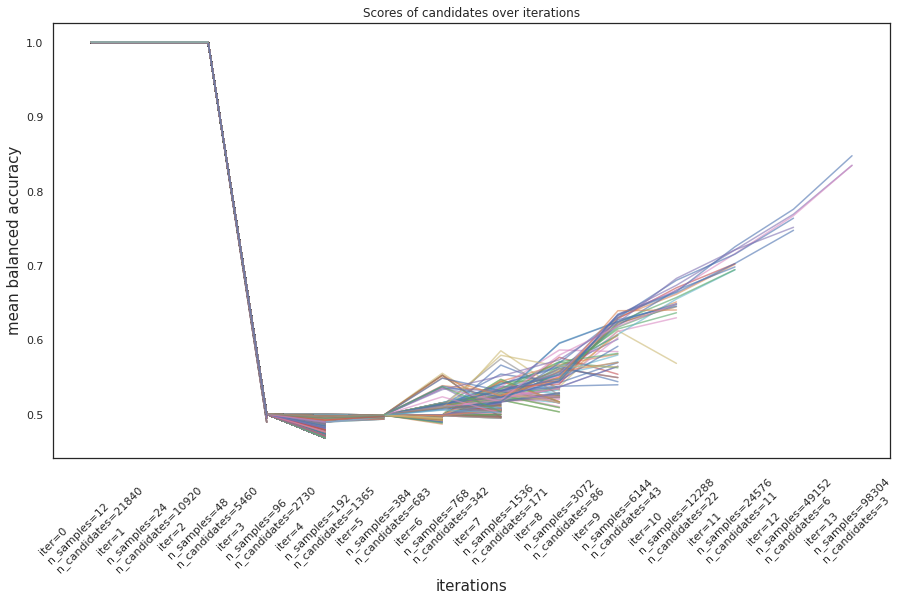

In [ ]:
# Lena
results = pd.DataFrame(search.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={search.n_resources_[i]}\nn_candidates={search.n_candidates_[i]}"
    for i in range(search.n_iterations_)
]

ax.set_xticks(range(search.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean balanced accuracy", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
#plt.tight_layout()
plt.show()

# Vergleich Default Parameter und Tuned Parameter

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import f1_score,  balanced_accuracy_score, accuracy_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier

metrics = []

X = df_extended.loc[:, df_extended.columns != "Target"].values
y = df_extended["Target"].values

select_best = SelectKBest(chi2, k=best_params["fs__k"])
X_new = select_best.fit_transform(X, y)

skf = StratifiedKFold(n_splits=10, random_state=random_state, shuffle=True)
for train_index, test_index in skf.split(X_new, y):
     X_train, X_test = X_new[train_index], X_new[test_index]
     y_train, y_test = y[train_index], y[test_index]

     clf = DecisionTreeClassifier(
         random_state=random_state, 
         criterion=best_params["clf__criterion"], 
         max_depth=best_params["clf__max_depth"], 
         min_samples_split=best_params["clf__min_samples_split"], 
         splitter=best_params["clf__splitter"],
         class_weight= best_params["clf__class_weight"])

     clf.fit(X_train, y_train)
     y_pred = clf.predict(X_test)
     tn, fp, fn, tp = confusion_matrix(y_true=y_test, y_pred=y_pred).ravel()


     metrics.append(
        {
            "classifier": "DecisionTree_Tuned",
            "accuracy": accuracy_score(y_true=y_test, y_pred=y_pred),
            "balanced_accuracy": balanced_accuracy_score(y_true=y_test, y_pred=y_pred),
            "f1_score": f1_score(y_true=y_test, y_pred=y_pred),
            "false_negativ_rate": fn / (tp+fn),
            "false_discovery_rate": fp /(tp+fp)

        }
    )


for train_index, test_index in skf.split(X, y):
     X_train, X_test = X[train_index], X[test_index]
     y_train, y_test = y[train_index], y[test_index]

     clf = DecisionTreeClassifier(
         random_state=random_state,
         class_weight= "balanced")

     clf.fit(X_train, y_train)
     y_pred = clf.predict(X_test)
     tn, fp, fn, tp = confusion_matrix(y_true=y_test, y_pred=y_pred).ravel()


     metrics.append(
        {
            "classifier": "DecisionTree_Default",
            "accuracy": accuracy_score(y_true=y_test, y_pred=y_pred),
            "balanced_accuracy": balanced_accuracy_score(y_true=y_test, y_pred=y_pred),
            "f1_score": f1_score(y_true=y_test, y_pred=y_pred),
            "false_negativ_rate": fn / (tp+fn),
            "false_discovery_rate": fp /(tp+fp)

        }
    )




In [ ]:
df_ml_metrics = pd.DataFrame.from_dict(metrics)
df_ml_metrics = df_ml_metrics.groupby("classifier").mean()
df_ml_metrics = df_ml_metrics.sort_values(by='balanced_accuracy', ascending=False)

df_ml_metrics.head()

,accuracy,balanced_accuracy,f1_score,false_negativ_rate,false_discovery_rate
classifier,,,,,
DecisionTree_Tuned,0.986,0.884,0.787,0.226,0.199
DecisionTree_Default,0.986,0.873,0.780,0.247,0.191


## Finales Training, Anwendung und Ableitung von Erkenntnissen

TEXT

In [ ]:
# Finales Training mit besten Parametern

X = df_extended.loc[:, df_extended.columns != "Target"]
y = df_extended["Target"]


select_best = SelectKBest(chi2, k=best_params["fs__k"])
X_new = select_best.fit_transform(X, y)

clf = DecisionTreeClassifier(
         random_state=random_state, 
         criterion=best_params["clf__criterion"], 
         max_depth=best_params["clf__max_depth"], 
         min_samples_split=best_params["clf__min_samples_split"], 
         splitter=best_params["clf__splitter"],
         class_weight= best_params["clf__class_weight"]
)


clf.fit(X_new, y)

DecisionTreeClassifier(max_depth=50, min_samples_split=5, random_state=42,
                       splitter='random')

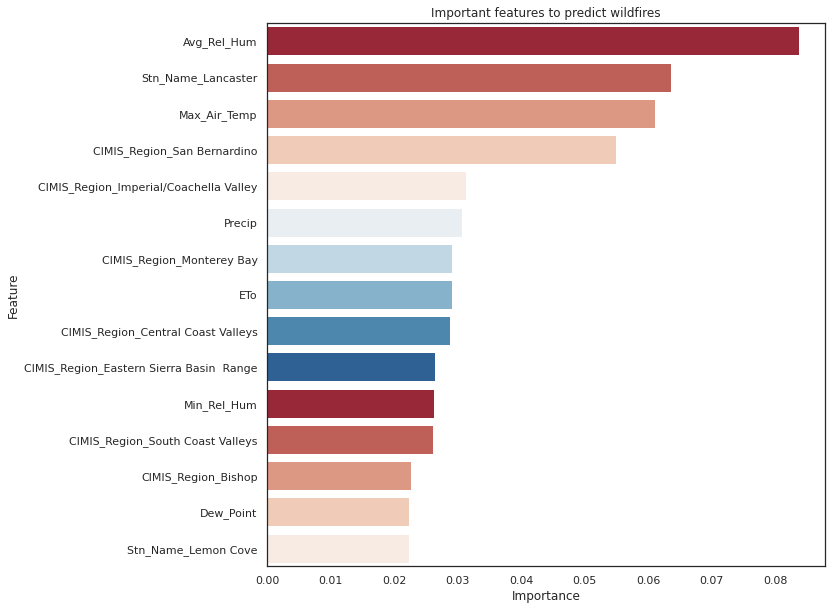

In [ ]:
# Visualisierung der Feature Importance

feat_dict= {}
for col, val in sorted(zip(
X.columns, clf.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val


feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})

values = feat_df.Importance.iloc[0:15]  
idx = feat_df.Feature.iloc[0:15] 
plt.figure(figsize=(10,10))
sns.barplot(y=idx,x=values,palette=colors).set(title='Important features to predict wildfires')
plt.show()

In [ ]:
# Realbeispiel
example_dict = [{
    "Stn_Id": 2,
    "Stn_Name": "Lindcove",
    "CIMIS_Region": "San Joaquin Valley",
    "Date": "8/24/2022",
    "ETo": 0.06,
    "Precip": 0.0,
    "Sol_Rad": 1019,
    "Avg_Vap_Pres": 7.3,
    "Max_Air_Temp": 100.4,
    "Min_Air_Temp": 95.2,
    "Avg_Air_Temp": 99.6,
    "Max_Rel_Hum": 82.1,
    "Min_Rel_Hum": 45.3,
    "Avg_Rel_Hum": 60.2,
    "Dew_Point": 36.6,
    "Avg_Wind_Speed": 50,
    "Wind_Run": 50,
    "Avg_Soil_Temp": 53,
    "Lat": 36.33,
    "Long": -119.11,
    "historic_precip_sum": 0,
    "historic_precip_avg": 0,
    "historic_air_temp": 100,
    "historic_soil_temp": 90,
    "historic_eto": 1,
    "historic_hum": 30,
    "historic_sol_rad": 1300,
    "historic_dew_point": 36,
    "historic_max_air_temp": 100,
    "historic_max_hum": 35 ,
    "Target": 1 # Just to conform the encoder shape. Will be deleted later
}]

# Erstellung des DataFrames
example = pd.DataFrame.from_dict(example_dict)
example = encoder.transform(example)
example = date_transformation(df=example)
# Transformierung und Skalierung
example = example.loc[:, ~example.columns.isin([ "Stn_Id"])]
example = example.replace(np.nan, 0)
target = example.columns.get_loc("Target")
example = scaler.transform(example)
# Löschen des Targets
example = np.delete(example, target)

example = select_best.transform(example.reshape(1, -1))
# Berechnung der Wahrscheinlichkeiten für Klassen
probas = clf.predict_proba(example.reshape(1, -1))
print(probas)

[[0.5 0.5]]


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SelectKBest was fitted with feature names
  "X does not have valid feature names, but"


# Auswertung der Metriken

# 6. Fazit und Ausblick